<a href="https://colab.research.google.com/github/Geoffrey-Chege/MORINGA_CORE_IPW7_GEOFFREY_CHEGE/blob/main/REDO_of_MORINGA_CORE_IPW7_GEOFFREY_CHEGE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1 Introduction

### Defining the Question

* Hass Consulting Company requires me to **study the factors** that affect housing prices real estate properties and to **create a model** that would allow the company to accurately predict the sale of prices upon being provided with the predictor variables. 

### Metrics for Success



* High model accuracy

### The context

* Hass Consulting Company which is a real estate leader will have an increased advantage in the sector by being able to highlight which factors affect housing prices and how they individually affect the prices. Additionally, a model that predicts the prices will be invaluable in helping the company perform better portfolio management.

### Experimental Design taken

- Data Reading & Cleaning
- Performing EDA
- Performing necessary feature engineering
- Performing regression analysis with the following models:
    - Multiple Linear Regression
    - Quantile Regression
    - Ridge Regression
    - Lasso Regression
    - Elastic Net Regression
- Incorporating categorical independent variables into the models.
- Checking for multicollinearity
- Providing a recommendation based on my analysis:
  * Creating residual plots for my models, and assessing heteroskedasticity using Barlett's test.
- Challenging my solution by providing insights on how to make improvements in the model.

### Appropriateness of the available Data

The data available is informaton on different housing units.

The link to the dataset: 
- http://bit.ly/IndependentProjectWeek7Dataset

## 2 Importing python Libraries to be used in Analysis

In [3]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 25.9 MB 100.9 MB/s
     |████████████████████████████████| 10.9 MB 5.1 MB/s 
     |████████████████████████████████| 596 kB 40.0 MB/s 
     |████████████████████████████████| 102 kB 9.3 MB/s 
     |████████████████████████████████| 675 kB 51.5 MB/s 
     |████████████████████████████████| 4.7 MB 29.5 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
     |████████████████████████████████| 812 kB 55.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.1.1-py2.py3-none-any.whl size=261287 sha256=827fb051f842626c831fcd95440f94633d8de63d94f8fe3be522bc4399039546
  Stored in directory: /tmp/pip-ephem-wheel-cache-raledofn/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=2a5853d40979d537ec45b8f24afe02d815e94883caa16dca2507459fc7437eae
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b1

In [4]:
!pip install pydataset
from pydataset import data

     |████████████████████████████████| 15.9 MB 4.6 MB/s 
  Created wheel for pydataset: filename=pydataset-0.2.0-py3-none-any.whl size=15939432 sha256=996c5fd9549877c091081edc0fc3823a6094f6ef1262b2546d3d85effc736062
  Stored in directory: /root/.cache/pip/wheels/32/26/30/d71562a19eed948eaada9a61b4d722fa358657a3bfb5d151e2
Successfully built pydataset
initiated datasets repo at: /root/.pydataset/


In [42]:
# Importing python libraries used in analysis

import pandas as pd
import numpy as np
import scipy as sp
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
import statsmodels.formula.api as smf
from statsmodels.regression.quantile_regression import QuantReg
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, recall_score, precision_score
from sklearn.metrics import mean_squared_error,  r2_score 
from sklearn.model_selection import KFold, LeaveOneOut
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')

## 3 Previewing the Datasets

In [6]:
# Creating and reading data frames

house = pd.read_csv('Independent Project Week 7 - house_data.csv')

In [7]:
# Previewing the top of the data frame

house.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [8]:
#check number of records

house.shape

(21613, 20)

## 4 Data Cleaning

### Missing Values

In [9]:
#checking column types
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

In [10]:
#checking for nulls
house.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

- From the above we can observe that our dataset is clean, it contains no nulls.

### Checking column names

In [11]:
# Checking column names

house.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

### Dropping unnecessary columns

In [12]:
#dropping unwanted columns id, lat,long

house.drop(['id','lat','long', 'zipcode','yr_built','yr_renovated'], axis=1, inplace=True)

### Checking for anomalies

Unique Values

In [14]:
# Checking the number of unique values in each column of the house data frame

for column in house.columns:
  print("Column: " + str(column))
  print("Number of unique values: " + str(house[column].nunique()))
  print('***********************')

Column: price
Number of unique values: 3625
***********************
Column: bedrooms
Number of unique values: 13
***********************
Column: bathrooms
Number of unique values: 30
***********************
Column: sqft_living
Number of unique values: 1038
***********************
Column: sqft_lot
Number of unique values: 9782
***********************
Column: floors
Number of unique values: 6
***********************
Column: waterfront
Number of unique values: 2
***********************
Column: view
Number of unique values: 5
***********************
Column: condition
Number of unique values: 5
***********************
Column: grade
Number of unique values: 12
***********************
Column: sqft_above
Number of unique values: 946
***********************
Column: sqft_basement
Number of unique values: 306
***********************
Column: sqft_living15
Number of unique values: 777
***********************
Column: sqft_lot15
Number of unique values: 8689
***********************


Duplicates

In [16]:
print('The dataset has ' + str(house.duplicated().sum()) + ' duplicates')

The dataset has 7 duplicates


These are very few and can be dropped.

In [19]:
house.drop_duplicates(inplace=True)
print('There are ' + str(house.duplicated().sum()) + ' duplicates')

There are 0 duplicates


In [21]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21606 entries, 0 to 21612
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21606 non-null  float64
 1   bedrooms       21606 non-null  int64  
 2   bathrooms      21606 non-null  float64
 3   sqft_living    21606 non-null  int64  
 4   sqft_lot       21606 non-null  int64  
 5   floors         21606 non-null  float64
 6   waterfront     21606 non-null  int64  
 7   view           21606 non-null  int64  
 8   condition      21606 non-null  int64  
 9   grade          21606 non-null  int64  
 10  sqft_above     21606 non-null  int64  
 11  sqft_basement  21606 non-null  int64  
 12  sqft_living15  21606 non-null  int64  
 13  sqft_lot15     21606 non-null  int64  
dtypes: float64(3), int64(11)
memory usage: 2.5 MB


### Checking for outliers

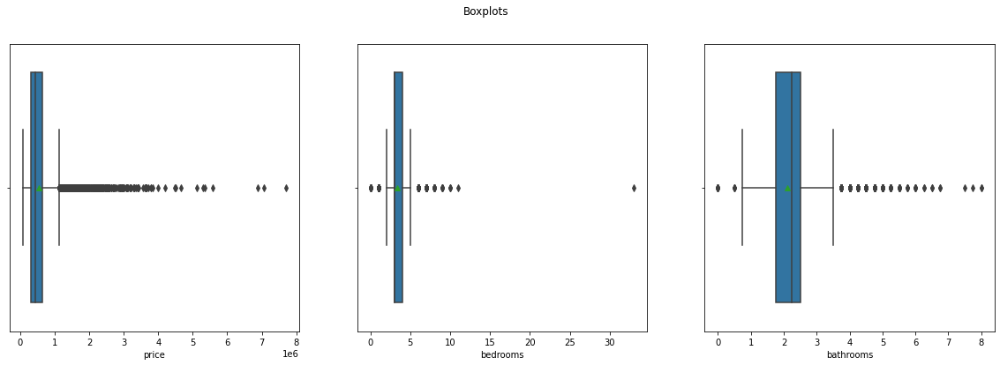

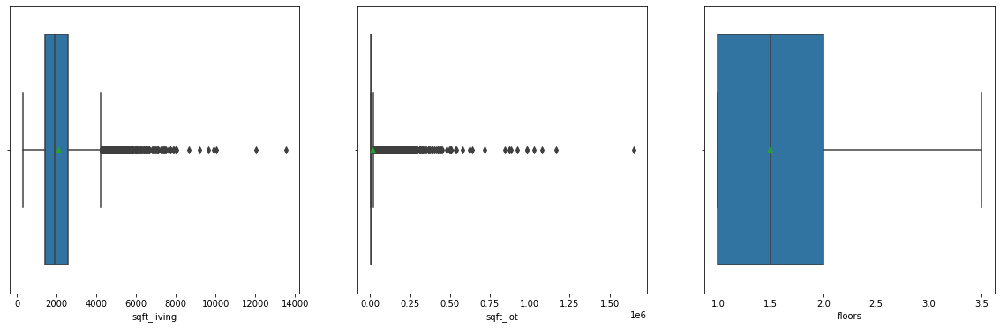

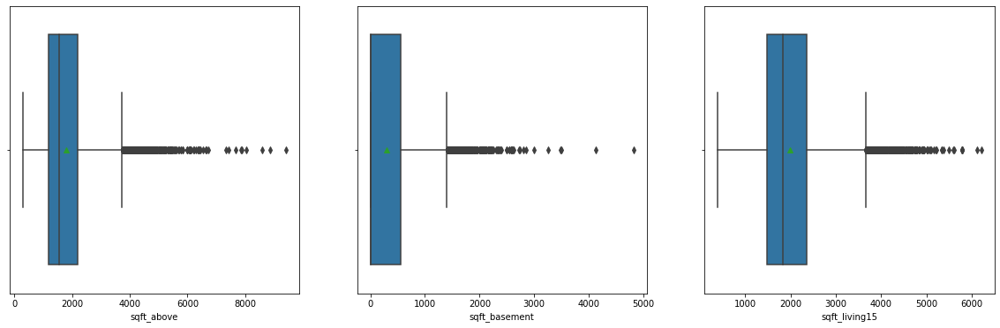

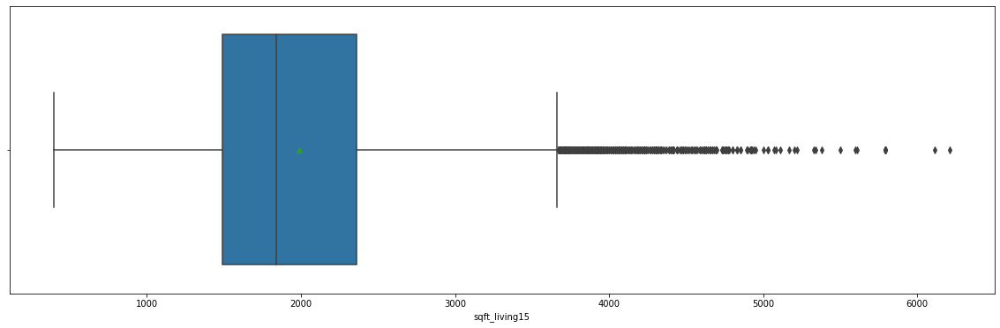

In [22]:
#checking for Outliers and Anomalies in the numerical columns
fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(20, 6))
fig.suptitle('Boxplots')
sns.boxplot(x = house['price'], ax=ax1, showmeans = True)
sns.boxplot(x = house['bedrooms'], ax=ax2, showmeans = True)
sns.boxplot(x = house['bathrooms'], ax=ax3, showmeans = True)

fig, (ax4,ax5,ax6) = plt.subplots(1,3, figsize=(20, 6))
sns.boxplot(x = house['sqft_living'], ax=ax4, showmeans = True)
sns.boxplot(x = house['sqft_lot'], ax=ax5, showmeans = True)
sns.boxplot(x = house['floors'], ax=ax6, showmeans = True)

fig, (ax7,ax8,ax9) = plt.subplots(1,3, figsize=(20, 6))
sns.boxplot(x = house['sqft_above'], ax=ax7, showmeans = True)
sns.boxplot(x = house['sqft_basement'], ax=ax8, showmeans = True)
sns.boxplot(x = house['sqft_living15'], ax=ax9, showmeans = True)

fig, (ax10) = plt.subplots(1, figsize=(20, 6))
sns.boxplot(x = house['sqft_living15'], ax=ax10, showmeans = True)
plt.show()

## 5 Exploratory Data Analysis

In [23]:
# Viweing a summary report of the house data frame

house_report = pp.ProfileReport(house)
house_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# Viweing a description of the house data frame

house.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,sqft_living15,sqft_lot15
count,2.160600e+04,21606.000000,21606.000000,21606.000000,2.160600e+04,21606.000000,21606.000000,21606.000000,21606.000000,21606.000000,21606.000000,21606.000000,21606.000000,21606.000000
mean,5.401964e+05,3.370869,2.114679,2079.947839,1.511082e+04,1.494076,0.007544,0.234240,3.409516,7.656623,1788.394335,291.553504,1986.577756,12771.097936
std,3.674140e+05,0.930076,0.770246,918.547546,4.142664e+04,0.539881,0.086531,0.766201,0.650800,1.175533,828.175310,442.628193,685.448915,27308.076286
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,399.000000,651.000000
25%,3.216125e+05,3.000000,1.750000,1427.750000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.069350e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,2360.000000,10083.750000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,6210.000000,871200.000000


## 6 Implementing the Solution

### 6.1 Multiple Linear Regression

#### Checking multicollinearity


In [25]:
# Multicollinearity test
# Let's display the correlations between the variables
correlations = house.corr()

correlations

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,sqft_living15,sqft_lot15
price,1.000000,0.308384,0.525163,0.702050,0.089645,0.256912,0.266333,0.397463,0.036369,0.667580,0.605574,0.323849,0.585369,0.082441
bedrooms,0.308384,1.000000,0.515994,0.576678,0.031692,0.175597,-0.006586,0.079437,0.028412,0.357152,0.477571,0.303176,0.391633,0.029222
bathrooms,0.525163,0.515994,1.000000,0.754734,0.087779,0.500702,0.063756,0.187923,-0.124900,0.665034,0.685390,0.283842,0.568699,0.087227
sqft_living,0.702050,0.576678,0.754734,1.000000,0.172814,0.354198,0.103818,0.284633,-0.058818,0.762893,0.876595,0.435067,0.756402,0.183264
sqft_lot,0.089645,0.031692,0.087779,0.172814,1.000000,-0.005072,0.021596,0.074735,-0.009006,0.113698,0.183517,0.015258,0.144601,0.718549
floors,0.256912,0.175597,0.500702,0.354198,-0.005072,1.000000,0.023745,0.029426,-0.263678,0.458084,0.524146,-0.245662,0.280084,-0.011129
waterfront,0.266333,-0.006586,0.063756,0.103818,0.021596,0.023745,1.000000,0.401991,0.016643,0.082802,0.072079,0.080583,0.086467,0.030695
view,0.397463,0.079437,0.187923,0.284633,0.074735,0.029426,0.401991,1.000000,0.045803,0.251437,0.167651,0.276991,0.280397,0.072556
condition,0.036369,0.028412,-0.124900,-0.058818,-0.009006,-0.263678,0.016643,0.045803,1.000000,-0.144586,-0.158261,0.174052,-0.092917,-0.003472
grade,0.667580,0.357152,0.665034,0.762893,0.113698,0.458084,0.082802,0.251437,-0.144586,1.000000,0.756089,0.168491,0.713401,0.119331


In [26]:
#VIF test

pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns=correlations.columns)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,sqft_living15,sqft_lot15
price,2.545366,0.223196,0.079619,-9.247286e+00,-0.007632,0.010999,-0.351009,-0.318287,-0.242870,-0.822110,7.161826e+00,3.781601e+00,-0.052310,0.141802
bedrooms,0.223196,1.659189,-0.411136,1.863531e+00,0.042588,0.085223,0.032685,0.081896,-0.109516,0.271514,-2.655491e+00,-1.454281e+00,0.011666,0.099593
bathrooms,0.079619,-0.411136,2.931943,2.827888e+00,-0.007264,-0.817900,-0.013764,0.038264,0.074225,-0.493042,-3.628234e+00,-2.240968e+00,0.041864,0.031949
sqft_living,-9.223526,1.817761,2.893533,5.923299e+14,-1.903768,0.817825,2.239492,-1.075148,1.326380,10.701398,-5.340529e+14,-2.854310e+14,0.654089,2.289669
sqft_lot,-0.007632,0.042588,-0.007264,-1.973093e+00,2.087723,0.078018,0.029951,-0.053139,0.013240,0.001135,1.540460e+00,9.264022e-01,0.128297,-1.473706
floors,0.010999,0.085223,-0.817900,9.148162e-01,0.078018,1.886598,-0.007858,-0.033277,0.201362,-0.389591,-1.231040e+00,1.729034e-01,0.338333,0.085741
waterfront,-0.351009,0.032685,-0.013764,2.238888e+00,0.029951,-0.007858,1.247853,-0.452340,0.028246,0.160220,-1.982718e+00,-9.919120e-01,0.069333,-0.037987
view,-0.318287,0.081896,0.038264,-1.071946e+00,-0.053139,-0.033277,-0.452340,1.417980,-0.017978,-0.038040,1.105204e+00,2.854351e-01,-0.236844,-0.005547
condition,-0.242870,-0.109516,0.074225,1.313095e+00,0.013240,0.201362,0.028246,-0.017978,1.127164,0.150885,-1.120035e+00,-7.190413e-01,0.061880,-0.025837
grade,-0.822110,0.271514,-0.493042,1.061000e+01,0.001135,-0.389591,0.160220,-0.038040,0.150885,3.420658,-1.062193e+01,-5.370640e+00,-0.842802,0.053424


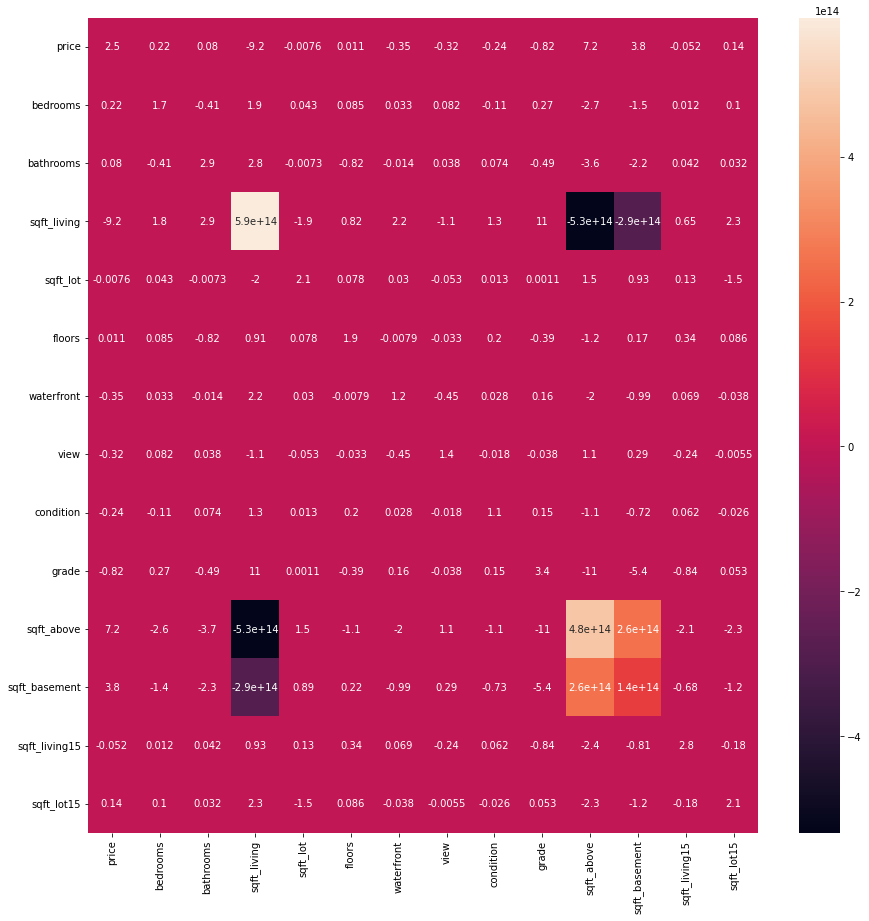

In [27]:
#visualizing VIF for easier interpretation

vif = pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns=correlations.columns)
plt.subplots(figsize =  (15,15))
sns.heatmap(vif, annot = True)
plt.show()

VIF scores for the sqft_living, sqft_above and sqft_basement are more than 10. They are highly correlated thus should be dropped

In [28]:
# dropping sqft_living, sqft_above and sqft_basement

house_drop = house.drop(columns=['sqft_living','sqft_above','sqft_basement'])

In [29]:
# correlations between the variables after dropping
correlations2 = house_drop.corr()

correlations2

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_living15,sqft_lot15
price,1.000000,0.308384,0.525163,0.089645,0.256912,0.266333,0.397463,0.036369,0.667580,0.585369,0.082441
bedrooms,0.308384,1.000000,0.515994,0.031692,0.175597,-0.006586,0.079437,0.028412,0.357152,0.391633,0.029222
bathrooms,0.525163,0.515994,1.000000,0.087779,0.500702,0.063756,0.187923,-0.124900,0.665034,0.568699,0.087227
sqft_lot,0.089645,0.031692,0.087779,1.000000,-0.005072,0.021596,0.074735,-0.009006,0.113698,0.144601,0.718549
floors,0.256912,0.175597,0.500702,-0.005072,1.000000,0.023745,0.029426,-0.263678,0.458084,0.280084,-0.011129
waterfront,0.266333,-0.006586,0.063756,0.021596,0.023745,1.000000,0.401991,0.016643,0.082802,0.086467,0.030695
view,0.397463,0.079437,0.187923,0.074735,0.029426,0.401991,1.000000,0.045803,0.251437,0.280397,0.072556
condition,0.036369,0.028412,-0.124900,-0.009006,-0.263678,0.016643,0.045803,1.000000,-0.144586,-0.092917,-0.003472
grade,0.667580,0.357152,0.665034,0.113698,0.458084,0.082802,0.251437,-0.144586,1.000000,0.713401,0.119331
sqft_living15,0.585369,0.391633,0.568699,0.144601,0.280084,0.086467,0.280397,-0.092917,0.713401,1.000000,0.183172


In [30]:
#VIF test after dropping

pd.DataFrame(np.linalg.inv(correlations2.values), index = correlations2.index, columns=correlations2.columns)

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_living15,sqft_lot15
price,2.255227,-0.031794,-0.279350,-0.045821,0.086465,-0.327708,-0.347985,-0.252827,-1.027599,-0.348139,0.094082
bedrooms,-0.031794,1.432807,-0.718811,0.004990,0.123266,0.051025,0.066265,-0.114129,0.077878,-0.268079,0.054279
bathrooms,-0.279350,-0.718811,2.461127,-0.040715,-0.627845,0.022373,-0.034272,0.047763,-0.702694,-0.256607,-0.015551
sqft_lot,-0.045821,0.004990,-0.040715,2.075564,0.037966,0.029240,-0.038544,0.019242,-0.048962,0.054442,-1.485953
floors,0.086465,0.123266,-0.627845,0.037966,1.516699,-0.040396,0.104119,0.255192,-0.497667,0.170600,0.056343
waterfront,-0.327708,0.051025,0.022373,0.029240,-0.040396,1.243980,-0.440153,0.032919,0.164512,0.074595,-0.037315
view,-0.347985,0.066265,-0.034272,-0.038544,0.104119,-0.440153,1.366935,-0.037966,0.000723,-0.176544,0.005047
condition,-0.252827,-0.114129,0.047763,0.019242,0.255192,0.032919,-0.037966,1.119327,0.167462,0.087522,-0.021358
grade,-1.027599,0.077878,-0.702694,-0.048962,-0.497667,0.164512,0.000723,0.167462,3.200636,-1.165153,0.000346
sqft_living15,-0.348139,-0.268079,-0.256607,0.054442,0.170600,0.074595,-0.176544,0.087522,-1.165153,2.328152,-0.254892


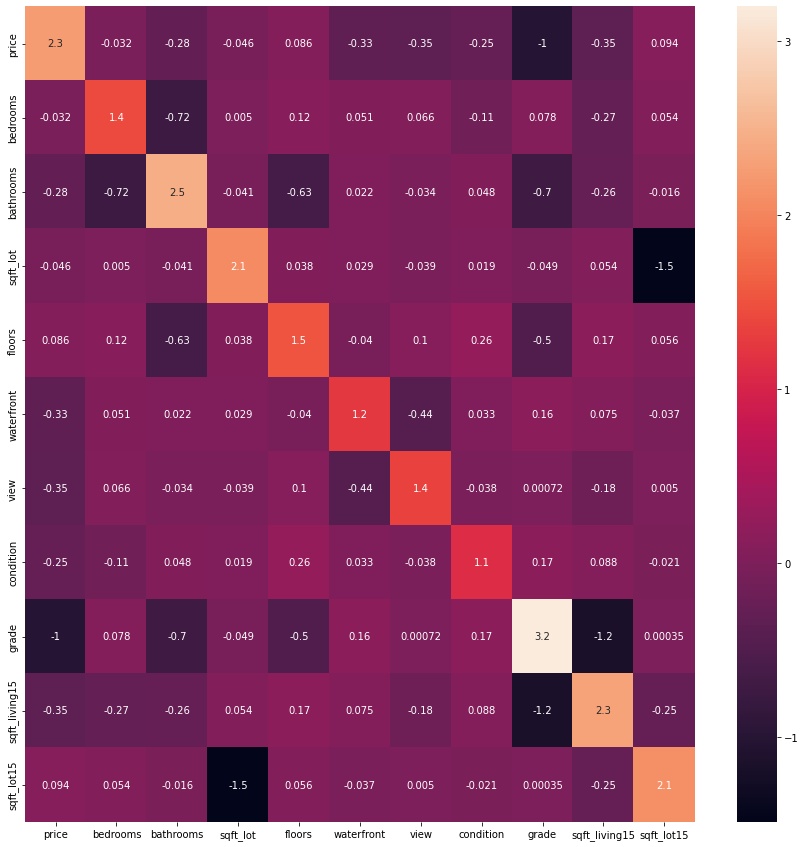

In [33]:
#visualizing VIF after dropping

vif2 = pd.DataFrame(np.linalg.inv(correlations2.values), index = correlations2.index, columns=correlations2.columns)
plt.subplots(figsize =  (15,15))
sns.heatmap(vif2, annot = True)
plt.show()

In [34]:
# price is the target variable, so i will create a data frame for the independent variables

house_independent = house_drop.drop(columns=['price'])
house_independent

,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_living15,sqft_lot15
0,3,1.00,5650,1.0,0,0,3,7,1340,5650
1,3,2.25,7242,2.0,0,0,3,7,1690,7639
2,2,1.00,10000,1.0,0,0,3,6,2720,8062
3,4,3.00,5000,1.0,0,0,5,7,1360,5000
4,3,2.00,8080,1.0,0,0,3,8,1800,7503
...,...,...,...,...,...,...,...,...,...,...
21608,3,2.50,1131,3.0,0,0,3,8,1530,1509
21609,4,2.50,5813,2.0,0,0,3,8,1830,7200
21610,2,0.75,1350,2.0,0,0,3,7,1020,2007
21611,3,2.50,2388,2.0,0,0,3,8,1410,1287


#### Residual plots

In [36]:
# Creating a model based on independent variables
# then displaying the residual plot for it.

X = house_independent.values
y = house_drop['price'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Prediction based on model
y_predict = regressor.predict(X_test)

# We now create the residual by substracting the test value from the predicted 
# value for each row in our dataset

residuals = np.subtract(y_predict, y_test)

# Let's describe our residual:
print(pd.DataFrame(residuals).describe())
print('****************')
residuals.mean()

                  0
count  4.322000e+03
mean  -4.136090e+03
std    2.366710e+05
min   -2.604692e+06
25%   -9.872896e+04
50%    1.626157e+04
75%    1.350476e+05
max    9.319550e+05
****************


-4136.089722761707

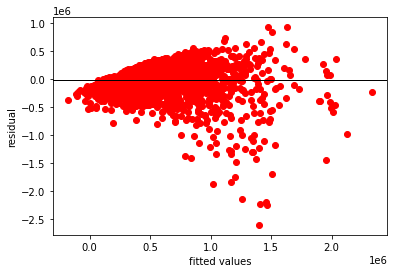

In [37]:
# Residual Plot

plt.scatter(y_predict, residuals, color='red')
plt.ylabel('residual')
plt.xlabel('fitted values')
plt.axhline(y= residuals.mean(), color='black', linewidth=1)
plt.show()

#### Assessing Heteroskedasticity using Barlett's test

In [38]:
test_result, p_value = sp.stats.bartlett(y_predict, residuals)

# To interpret the results we must also compute a critical value of the chi squared distribution
degree_of_freedom = len(y_predict)-1
probability = 1 - p_value

critical_value = sp.stats.chi2.ppf(probability, degree_of_freedom)
print(critical_value)

# If the test_result is greater than the critical value, then we reject our null
# hypothesis. This would mean that there are patterns to the variance of the data

# Otherwise, we can identify no patterns, and we accept the null hypothesis that 
# the variance is homogeneous across our data

if (test_result > critical_value):
  print('the variances are unequal, and the model should be reassessed')
else:
  print('the variances are homogeneous!')

inf
the variances are homogeneous!


#### MLR

In [39]:
# Defining predictor and target variables
# The target variable is price

X = house_independent.values
y = house_drop['price'].values

##### Splitting the dataset into the Training set and Test set

In [40]:
# Splitting dataset into train and test sets

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)

In [43]:
# Scaling data using the StandardScaler() object
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

##### Training the Multiple Linear Regression model on the Training set

In [45]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

##### Predicting the Test set results

In [46]:
# mean squared error of MLR model for comparison purposes

model1 = (mean_squared_error(y_test,y_pred))
print(model1)

62688409098.031006


##### Assessing Model Performance

In [47]:
#Evaluating Model
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('R-Squared:', metrics.r2_score(y_test, y_pred))

Mean Absolute Error: 158540.48853250765
Mean Squared Error: 62688409098.031006
Root Mean Squared Error: 250376.5346393927
R-Squared: 0.5451201621555475


* The accuracy of the MLR is 54.51%

### 6.2 Quantile Regression

#### 0.25 Quantile Regression

In [53]:
#Getting summary report of dataset at 0.25 Quantile
mod = smf.quantreg('price ~ bedrooms + bathrooms + sqft_lot + floors + waterfront + view + condition+ grade + sqft_living15 + sqft_lot15', house)
res = mod.fit(q=.25)

print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  price   Pseudo R-squared:               0.2390
Model:                       QuantReg   Bandwidth:                   2.491e+04
Method:                 Least Squares   Sparsity:                    4.143e+05
Date:                Wed, 23 Feb 2022   No. Observations:                21606
Time:                        05:00:18   Df Residuals:                    21595
                                        Df Model:                           10
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -4.213e+05   1.17e+04    -35.984      0.000   -4.44e+05   -3.98e+05
bedrooms      -1.081e+04   1475.991     -7.325      0.000   -1.37e+04   -7918.365
bathrooms      2.751e+04   2394.279     11.489      0.000    2.28e+04    3.22e+04
sqft_lot          0.3266      0.051  

Accuracy of this model is 23.9%, which is not ideal

#### 0.5 Quantile Regression

In [49]:
# Finding the regression coefficients for the conditioned median, 0.5 quantile
mod = smf.quantreg('price ~ bedrooms + bathrooms + sqft_lot + floors + waterfront + view + condition+ grade + sqft_living15 + sqft_lot15', house)
res = mod.fit(q=.5)

# Then print out the summary of model
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  price   Pseudo R-squared:               0.3177
Model:                       QuantReg   Bandwidth:                   2.757e+04
Method:                 Least Squares   Sparsity:                    3.781e+05
Date:                Wed, 23 Feb 2022   No. Observations:                21606
Time:                        04:52:55   Df Residuals:                    21595
                                        Df Model:                           10
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -7.304e+05   1.29e+04    -56.679      0.000   -7.56e+05   -7.05e+05
bedrooms       3847.7453   1655.239      2.325      0.020     603.355    7092.135
bathrooms      1.942e+04   2601.454      7.464      0.000    1.43e+04    2.45e+04
sqft_lot          0.1975      0.045  

Accuracy of this model is 31.77%, which is not ideal

#### 0.75 Quantile Regression

In [51]:
#Getting summary report of dataset at 0.25 Quantile
mod = smf.quantreg('price ~ bedrooms + bathrooms + sqft_lot + floors + waterfront + view + condition+ grade + sqft_living15 + sqft_lot15', house)
res = mod.fit(q=.75)

print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  price   Pseudo R-squared:               0.3721
Model:                       QuantReg   Bandwidth:                   2.485e+04
Method:                 Least Squares   Sparsity:                    5.828e+05
Date:                Wed, 23 Feb 2022   No. Observations:                21606
Time:                        04:57:12   Df Residuals:                    21595
                                        Df Model:                           10
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -8.356e+05      2e+04    -41.708      0.000   -8.75e+05   -7.96e+05
bedrooms       9197.2487   2352.365      3.910      0.000    4586.440    1.38e+04
bathrooms      2.615e+04   3795.939      6.890      0.000    1.87e+04    3.36e+04
sqft_lot          0.2113      0.061  

Accuracy of this model is 37.21%, which is not ideal

### 6.3 Ridge Regression

In [55]:
# Data Preparation

# Setting up X and y datasets
X = house_independent.values
y = house['price'].values

In [58]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [59]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [60]:
#ridge
#
ridge = Ridge(normalize=True)
search = GridSearchCV(estimator=ridge,param_grid={'alpha':np.logspace(-5,2,8)},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [61]:
# We now use the .fit function to run the model and then use the .best_params_ and
#  .best_scores_ function to determine the models strength. 
# 
search.fit(X_train,y_train)
print(search.best_params_)
abs(search.best_score_) 

{'alpha': 0.001}


61086004482.9978

In [62]:
# We can confirm this by fitting our model with the ridge information and finding the mean squared error below
#
ridge = Ridge(normalize=True,alpha=0.0001)
ridge.fit(X_train,y_train)
second_model = (mean_squared_error(y_true=y_test,y_pred=ridge.predict(X_test)))
sec_model = (np.sqrt(mean_squared_error(y_true=y_test,y_pred=ridge.predict(X_test))))
rsecond_model = (r2_score(y_true=y_test,y_pred=ridge.predict(X_test)))
print("MSE:       ", second_model)
print("RMSE:      ", sec_model)
print("R-squared: ", rsecond_model)

MSE:        56017258245.90008
RMSE:       236679.65321484668
R-squared:  0.5789048702311084


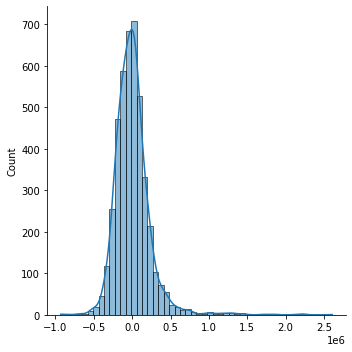

In [63]:
#Residual Plot distribution
y_pred=ridge.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

Accuracy of ridge is 57.89%, which is a slight improvement from MLR

### 6.4 Lasso Regression

In [64]:
# Features and label

X = house_independent.values
y = house['price'].values

In [65]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 10)

In [66]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [67]:
#setting parameter space
parameters = {'alpha': np.concatenate((np.arange(0.1,2,0.1), np.arange(2, 5, 0.5), np.arange(5, 25, 1)))}

#lasso regression
lasso = Lasso() 
gridlasso = GridSearchCV(lasso, parameters, scoring ='r2') 

# Fitting models and print the best parameters, R-squared scores, MSE, and coefficients
gridlasso.fit(X_train, y_train) 
print("lasso best parameters:", gridlasso.best_params_) 
print("lasso score:", gridlasso.score(X_test, y_test))
print("lasso MSE:", mean_squared_error(y_test, gridlasso.predict(X_test)))
print("lasso RMSE:", np.sqrt(mean_squared_error(y_test, gridlasso.predict(X_test))))
print("lasso R-squared:", r2_score(y_test, gridlasso.predict(X_test)))
print("lasso best estimator coef:", gridlasso.best_estimator_.coef_)

lasso best parameters: {'alpha': 24.0}
lasso score: 0.5432039322194435
lasso MSE: 69864681008.71227
lasso RMSE: 264319.27854152495
lasso R-squared: 0.5432039322194435
lasso best estimator coef: [  5768.80228814  43302.60332191   6056.31788654 -13083.65184757
  48294.1944534   58104.5480601   41303.95377801 166061.54427355
  57002.91307954 -14237.84968073]


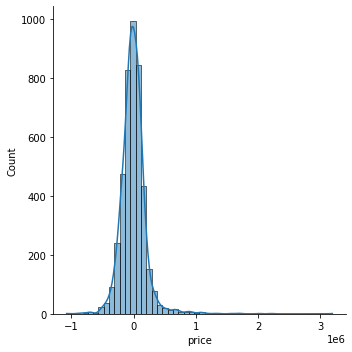

In [ ]:
#Residual Plot distribution
y_pred = gridlasso.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

Accuracy of Lasso is 54.32, very close to MLR but less than Ridge.

### 6.5 Elastic Net Regression

In [68]:
# Features and label

X = house_independent.values
y = house['price'].values

In [71]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 10)

In [72]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [73]:
# Elastic Net Model
 
elastic=ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic,param_grid={'alpha':np.logspace(-5,2,8),'l1_ratio':[.2,.4,.6,.8]},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [74]:
# We will now fit our model and display the best parameters and the best results we can get with that setup.
# 
search.fit(X,y)
print(search.best_params_)
abs(search.best_score_)

{'alpha': 1e-05, 'l1_ratio': 0.8}


60259326206.179115

In [75]:
# The best hyperparameters was an alpha set to 0.00001 and a l1_ratio of 0.8. 
elastic=ElasticNet(normalize=True,alpha=0.00001,l1_ratio=0.8)

elastic.fit(X_train,y_train)
third_model=(mean_squared_error(y_true=y_test,y_pred=elastic.predict(X_test)))
th_m = np.sqrt(mean_squared_error(y_true=y_test,y_pred=elastic.predict(X_test)))
third_m = r2_score(y_true=y_test,y_pred=elastic.predict(X_test))
print("MSE:       ", third_model)
print("RMSE:      ", th_m)
print("R-squared: ", third_m)

MSE:        62747366954.60392
RMSE:       250494.24535227136
R-squared:  0.5446923519650607


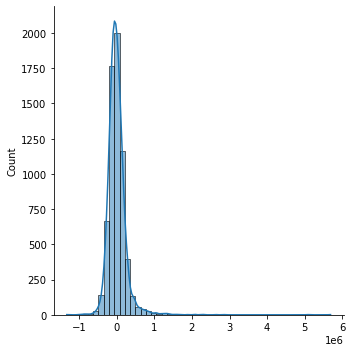

In [76]:
#Residual Plot distribution
y_pred=elastic.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

Accuracy of Elastic Net is 54.47%, which is very close to MLR and Lasso, but less than Ridge

## 7 Conclusion

* The Ridge regression model gave the most accuracy out of all the models.
* Quantile regression models were the worst performing thus not suitable for this research.